In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from pathlib import Path

import os
import matplotlib.pyplot as plt

import sklearn
from sklearn.svm import SVC
from sklearn.metrics import balanced_accuracy_score, roc_auc_score, accuracy_score
from scipy.stats import zscore, pearsonr, uniform
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold, StratifiedKFold, RandomizedSearchCV
from sklearn.decomposition import PCA

from scipy.io import loadmat

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


In [2]:
# Base directory
BASE_DIR = Path("../../data")
RAW_DIR = BASE_DIR / "raw" / "widsdatathon2025"
PROCESSED_DIR = BASE_DIR / "preprocessed"
PROCESSED_DIR.mkdir(parents=True, exist_ok=True)

In [3]:
# Load Training Data
train_cat = pd.read_excel(RAW_DIR / "TRAIN/TRAIN_CATEGORICAL_METADATA.xlsx")
train_fcm = pd.read_csv(RAW_DIR / "TRAIN/TRAIN_FUNCTIONAL_CONNECTOME_MATRICES.csv")
train_quant = pd.read_excel(RAW_DIR / "TRAIN/TRAIN_QUANTITATIVE_METADATA.xlsx")
train_solutions = pd.read_excel(RAW_DIR / "TRAIN/TRAINING_SOLUTIONS.xlsx")

In [4]:
combined_df = pd.merge(train_cat, train_solutions, on='participant_id')
combined_df.head()
combined_df_q = pd.merge(train_quant, train_solutions, on='participant_id')
combined_df_q.head()

,participant_id,EHQ_EHQ_Total,ColorVision_CV_Score,APQ_P_APQ_P_CP,APQ_P_APQ_P_ID,APQ_P_APQ_P_INV,APQ_P_APQ_P_OPD,APQ_P_APQ_P_PM,APQ_P_APQ_P_PP,SDQ_SDQ_Conduct_Problems,...,SDQ_SDQ_Emotional_Problems,SDQ_SDQ_Externalizing,SDQ_SDQ_Generating_Impact,SDQ_SDQ_Hyperactivity,SDQ_SDQ_Internalizing,SDQ_SDQ_Peer_Problems,SDQ_SDQ_Prosocial,MRI_Track_Age_at_Scan,ADHD_Outcome,Sex_F
0,UmrK0vMLopoR,40.00,13,3,10,47,13,11,28,0,...,1,5,0,5,1,0,10,NaN,1,1
1,CPaeQkhcjg7d,-94.47,14,3,13,34,18,23,30,0,...,6,8,7,8,10,4,5,NaN,1,0
2,Nb4EetVPm3gs,-46.67,14,4,10,35,16,10,29,1,...,2,8,5,7,6,4,9,8.239904,1,0
3,p4vPhVu91o4b,-26.68,10,5,12,39,19,16,28,6,...,4,16,9,10,8,4,6,NaN,1,1
4,M09PXs7arQ5E,0.00,14,5,15,40,20,24,28,1,...,4,11,4,10,7,3,9,8.940679,1,1


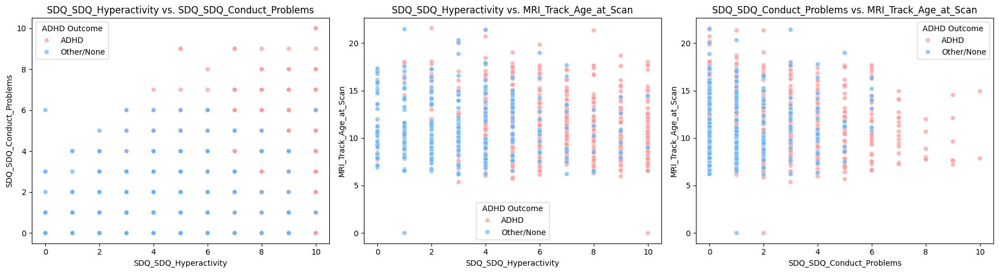

In [5]:
combined_df_q["ADHD_Label"] = combined_df_q["ADHD_Outcome"].map({0: "Other/None", 1: "ADHD"})
quant_features = ["SDQ_SDQ_Hyperactivity", "SDQ_SDQ_Conduct_Problems", "MRI_Track_Age_at_Scan"]

feature_pairs = [
    ("SDQ_SDQ_Hyperactivity", "SDQ_SDQ_Conduct_Problems"),
    ("SDQ_SDQ_Hyperactivity", "MRI_Track_Age_at_Scan"),
    ("SDQ_SDQ_Conduct_Problems", "MRI_Track_Age_at_Scan"),
]

fig, axes = plt.subplots(1, len(feature_pairs), figsize=(6 * len(feature_pairs), 5))

if len(feature_pairs) == 1:
    axes = [axes]

for ax, (feat_x, feat_y) in zip(axes, feature_pairs):
    sns.scatterplot(data=combined_df_q, x=feat_x, y=feat_y, hue="ADHD_Label", alpha=0.7, palette=["#ff9999", "#66b3ff"], ax=ax)
    ax.set_title(f"{feat_x} vs. {feat_y}")
    ax.legend(title="ADHD Outcome")

plt.tight_layout()
plt.show()

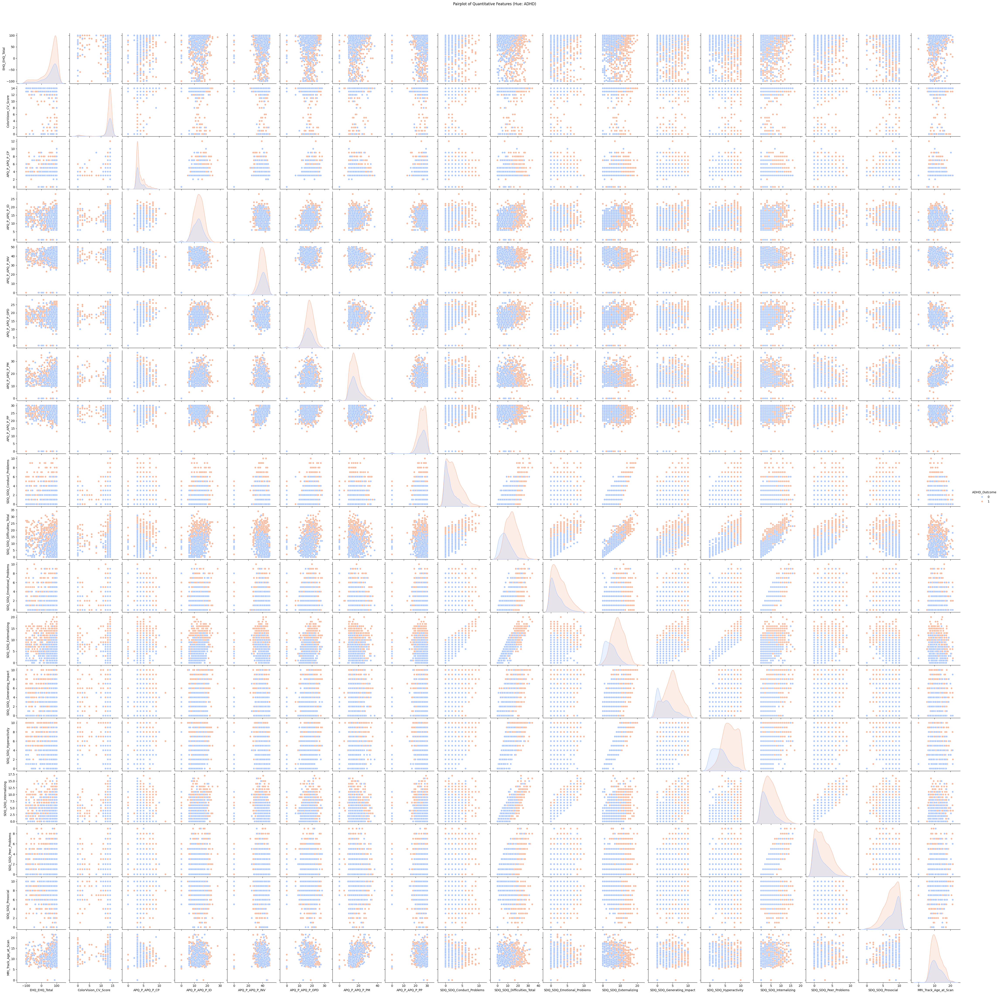

In [18]:
combined_df_q["ADHD_Label"] = combined_df_q["ADHD_Outcome"].map({0: "Other/None", 1: "ADHD"})

pairplot_vars = [col for col in train_quant.columns if col != "participant_id"]

sns.pairplot(data=combined_df_q, vars=pairplot_vars, hue="ADHD_Outcome", palette="coolwarm")
plt.suptitle("Pairplot of Quantitative Features (Hue: ADHD)", y=1.02)
plt.show()

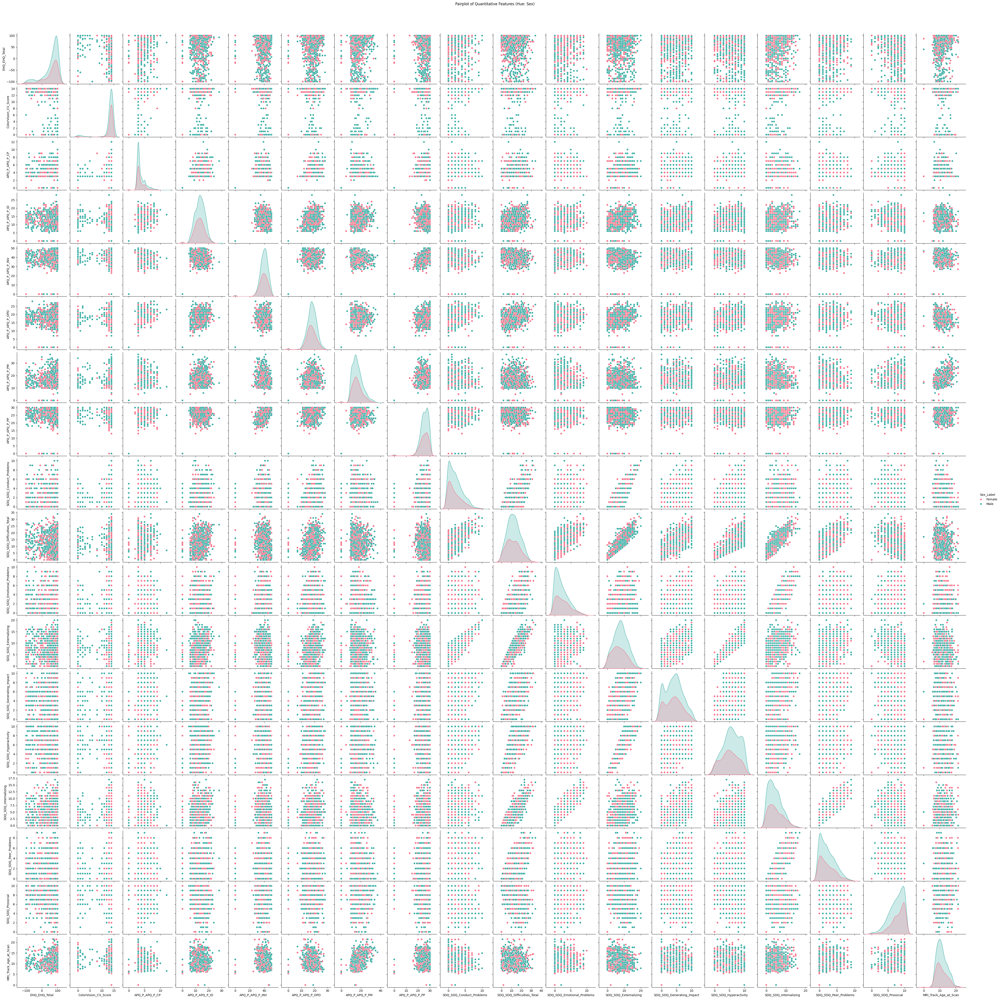

In [19]:
#Pairplot plot for each feature color coded by Sex
combined_df_q["Sex_Label"] = combined_df_q["Sex_F"].map({0: "Male", 1: "Female"})
sns.pairplot(data=combined_df_q, vars=pairplot_vars, hue="Sex_Label", palette="husl")
plt.suptitle("Pairplot of Quantitative Features (Hue: Sex)", y=1.02)
plt.show()

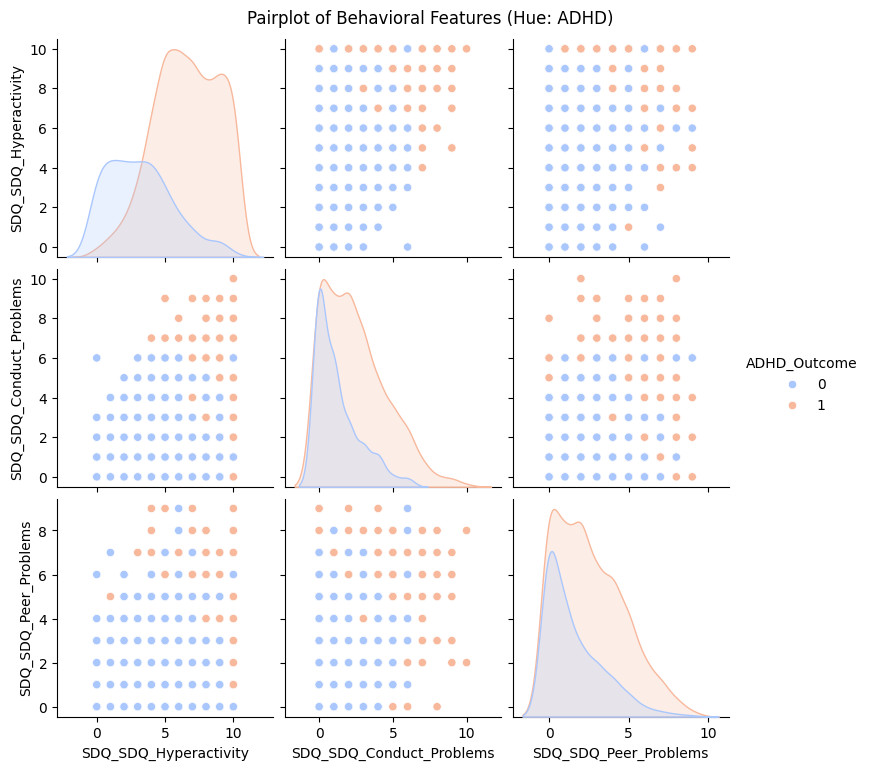

In [20]:
#Behavioral Features For ADHD

selected_vars_1 = ["SDQ_SDQ_Hyperactivity", "SDQ_SDQ_Conduct_Problems", "SDQ_SDQ_Peer_Problems"]
sns.pairplot(data=combined_df_q, vars=selected_vars_1, hue="ADHD_Outcome", palette="coolwarm")
plt.suptitle("Pairplot of Behavioral Features (Hue: ADHD)", y=1.02)
plt.show()
